<a href="https://colab.research.google.com/github/shrestha1/AT3_MLA/blob/rusan/MLAA_AT3_MEAN_SHIFT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive

drive.mount('/content/gdrive')
%cd /content/gdrive/MyDrive

In [ ]:
import pandas as pd
import numpy as np

In [67]:
df_cleaned = pd.read_csv('data_cleaned.csv')

In [70]:
df_cleaned.drop('Unnamed: 0', axis=1, inplace=True)

In [37]:
df_cleaned.head()

,entertainment,food_dining,gas_transport,grocery_net,grocery_pos,health_fitness,home,kids_pets,misc_net,misc_pos,personal_care,shopping_net,shopping_pos,travel,kmeans_4,kmeans_3
0,10117.78,9411.51,9094.37,16056.04,22502.97,12319.57,18540.93,12379.49,13326.13,12910.52,9308.94,8984.54,18950.22,687.28,1,1
1,13864.75,13866.55,8374.89,12967.38,30065.98,10203.07,15673.86,13777.83,11050.25,20290.53,13509.64,19698.60,19008.20,1884.09,1,1
2,5999.48,10654.46,6868.98,10126.65,17648.31,9197.97,10257.21,7398.97,7397.43,11629.76,9412.31,9756.31,11099.09,772.61,2,2
3,1504.40,1225.15,1263.77,2353.88,3748.32,1993.22,2500.07,5140.84,1752.15,2646.95,1357.40,4217.13,2605.76,294.38,3,0
4,2467.92,3184.05,1526.71,3468.83,6881.51,1109.39,2470.35,3876.71,2172.44,3057.63,3398.50,4281.31,2955.76,157.70,0,0


In [71]:
feat_list = df_cleaned.columns.tolist()

In [93]:
feat_list = [feature for feature in feat_list if feature not in ['kmeans_4', 'kmeans_3']]
feat_list

['entertainment',
 'food_dining',
 'gas_transport',
 'grocery_net',
 'grocery_pos',
 'health_fitness',
 'home',
 'kids_pets',
 'misc_net',
 'misc_pos',
 'personal_care',
 'shopping_net',
 'shopping_pos',
 'travel']

In [59]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

In [85]:
X = scaler.fit_transform(df_cleaned[feat_list])

In [86]:
from sklearn.cluster import MeanShift

meanshift = MeanShift()

In [87]:
meanshift.fit(X)

MeanShift()

In [88]:
df_cleaned['meanshift'] = meanshift.predict(X)

In [89]:
pairs = [(a, b) for idx, a in enumerate(feat_list) for b in feat_list[idx + 1:]]
pairs

[('entertainment', 'food_dining'),
 ('entertainment', 'gas_transport'),
 ('entertainment', 'grocery_net'),
 ('entertainment', 'grocery_pos'),
 ('entertainment', 'health_fitness'),
 ('entertainment', 'home'),
 ('entertainment', 'kids_pets'),
 ('entertainment', 'misc_net'),
 ('entertainment', 'misc_pos'),
 ('entertainment', 'personal_care'),
 ('entertainment', 'shopping_net'),
 ('entertainment', 'shopping_pos'),
 ('entertainment', 'travel'),
 ('food_dining', 'gas_transport'),
 ('food_dining', 'grocery_net'),
 ('food_dining', 'grocery_pos'),
 ('food_dining', 'health_fitness'),
 ('food_dining', 'home'),
 ('food_dining', 'kids_pets'),
 ('food_dining', 'misc_net'),
 ('food_dining', 'misc_pos'),
 ('food_dining', 'personal_care'),
 ('food_dining', 'shopping_net'),
 ('food_dining', 'shopping_pos'),
 ('food_dining', 'travel'),
 ('gas_transport', 'grocery_net'),
 ('gas_transport', 'grocery_pos'),
 ('gas_transport', 'health_fitness'),
 ('gas_transport', 'home'),
 ('gas_transport', 'kids_pets'),
 (

<ipython-input-90-eaf75380ea00>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


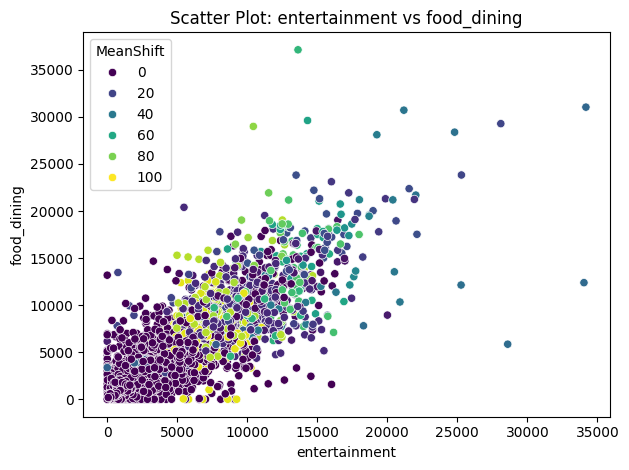

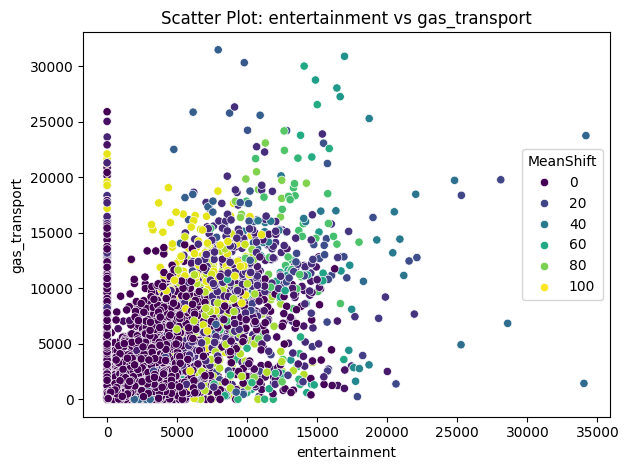

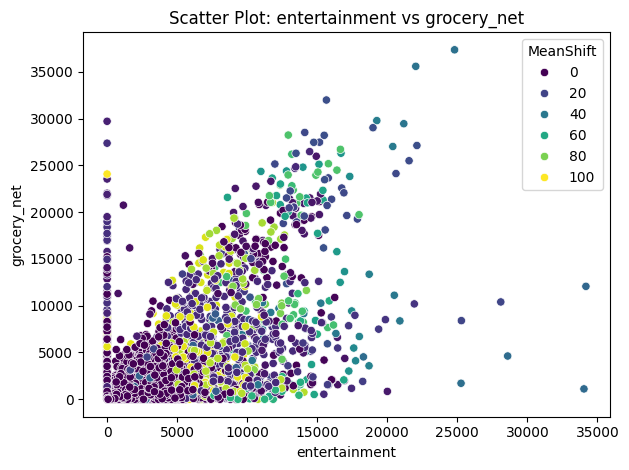

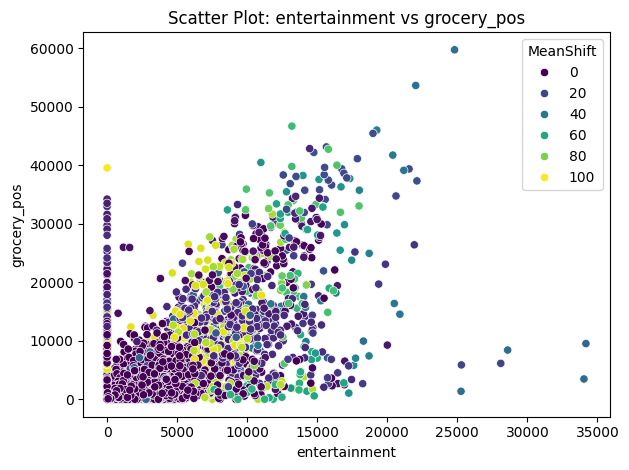

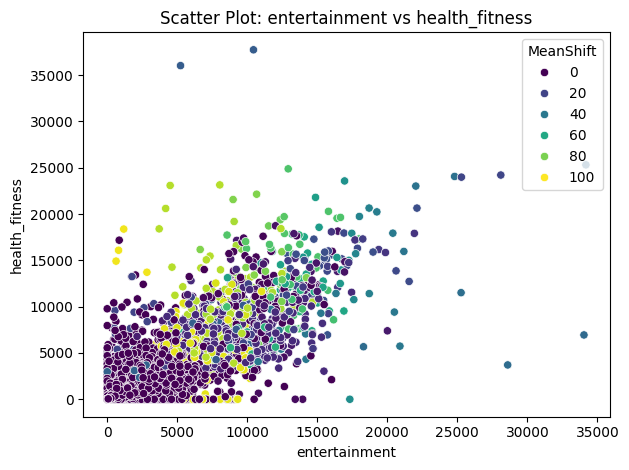

...

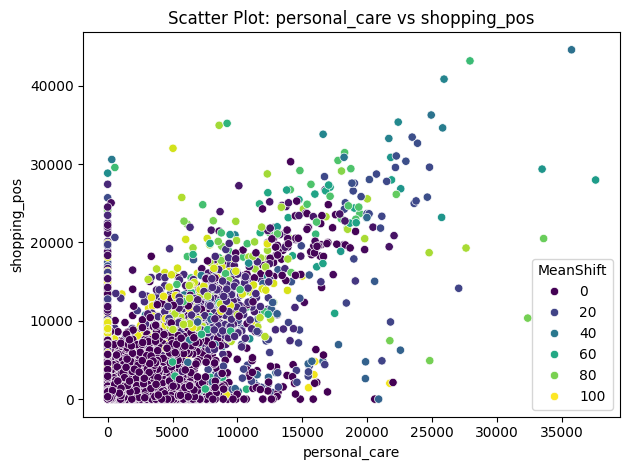

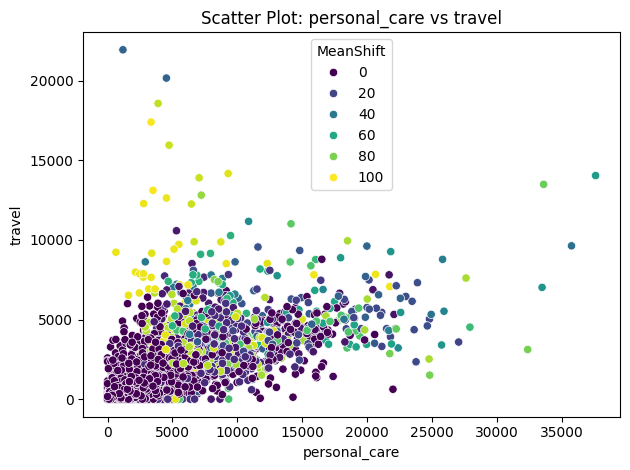

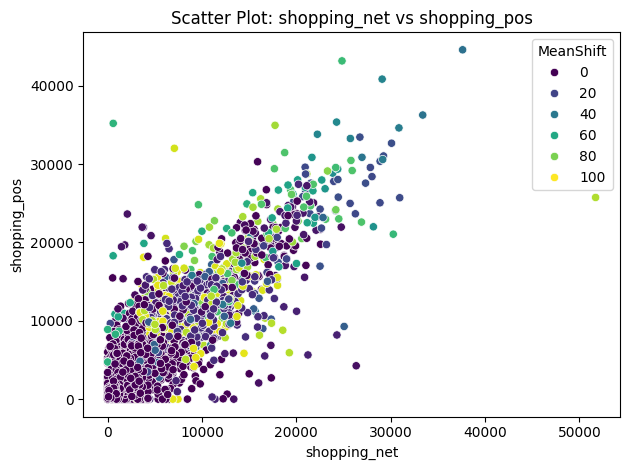

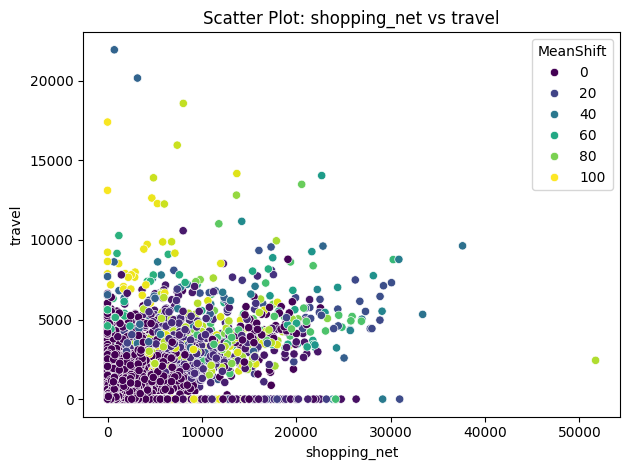

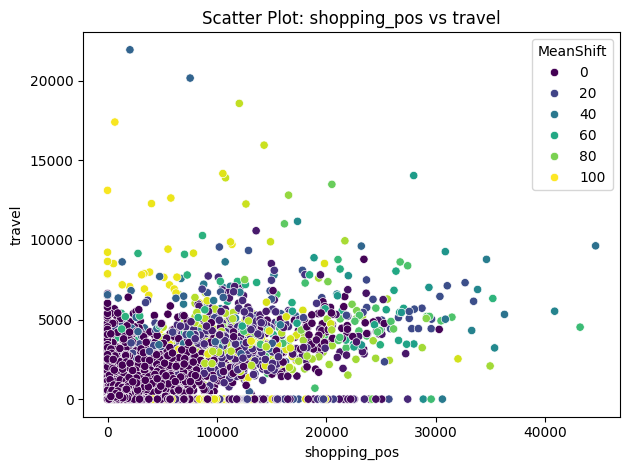

In [90]:
import matplotlib.pyplot as plt
import seaborn as sns

for a, b in pairs:
    plt.figure()
    sns.scatterplot(x=df_cleaned[a], y=df_cleaned[b], hue=df_cleaned['meanshift'], palette='viridis')
    plt.title(f'Scatter Plot: {a} vs {b}')
    plt.legend(title='MeanShift')
    plt.tight_layout()

In [91]:
df_cleaned.head(20)

,entertainment,food_dining,gas_transport,grocery_net,grocery_pos,health_fitness,home,kids_pets,misc_net,misc_pos,personal_care,shopping_net,shopping_pos,travel,kmeans_4,kmeans_3,meanshift
0,10117.78,9411.51,9094.37,16056.04,22502.97,12319.57,18540.93,12379.49,13326.13,12910.52,9308.94,8984.54,18950.22,687.28,1,1,70
1,13864.75,13866.55,8374.89,12967.38,30065.98,10203.07,15673.86,13777.83,11050.25,20290.53,13509.64,19698.60,19008.20,1884.09,1,1,1
2,5999.48,10654.46,6868.98,10126.65,17648.31,9197.97,10257.21,7398.97,7397.43,11629.76,9412.31,9756.31,11099.09,772.61,2,2,12
3,1504.40,1225.15,1263.77,2353.88,3748.32,1993.22,2500.07,5140.84,1752.15,2646.95,1357.40,4217.13,2605.76,294.38,3,0,0
4,2467.92,3184.05,1526.71,3468.83,6881.51,1109.39,2470.35,3876.71,2172.44,3057.63,3398.50,4281.31,2955.76,157.70,0,0,0
5,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,18.44,0.00,0.00,1142.18,3,0,0
6,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,134.01,0.00,0.00,2141.38,3,0,0
7,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.43,0.00,0.00,963.92,3,0,0
8,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,6.04,3,0,0
9,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8.62,0.00,0.00,398.87,3,0,0


In [94]:
df_cleaned.to_csv('data_cleaned_2.csv')